#  <span style="color:orange">Style transfer using image segmentation </span>

<a href="https://colab.research.google.com/github/datarootsio/workshop-image-segmentation-style-transfer/blob/main/notebooks/tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Do you want to restyle or redesign your interior, but don't want to leave the comfort of your own home? Don't fancy reading through hundreds of interior design albums or going to your local furniture store to try imagining those couches in your own living room? Have you always dreamed of a couch with an extravagant tiger print, but you don't know if it will fit your interior? 

**Style transfer is the right thing for you!**

# 1 Tutorial objectives

This tutorial will show you how to apply style transfer to a picture using image segmentation.

If you want to discover the final AI-driven application which allows you to add different colors or patterns to an image, you can check [this link](https://huggingface.co/spaces/dataroots/SofaStyler). The app is available through our HuggingFace Space.

We use Colab for the ease of the demo, we do not advise to build your style transfer application within a notebook. The goal is to have a visual easy to follow tutorial to understand how to apply style transfer to an image.

<span style="color:red">IMPORTANT INSTRUCTIONS: </span>
Please make a copy of this notebook, upload it into your own google drive.

If you decided to open this notebook without cloning the entire GitHub repository, please make sure to upload all the needed files manually. 

Some explanatory slides can be found at [here](https://docs.google.com/presentation/d/1CRXKIo7pHhwZBUiu-Q43TzV7_PiAuPKgLxwlTADsxIo/edit#slide=id.g1594352701a_0_78).

![Maintainer](https://dataroots.io/maintained-rnd.svg)

## 1.1 Prerequisites

In [1]:
#@markdown This tutorial is tested using Python 3.9.16. Please check that you have the right version of python installed on your current environment using the following command:
!python --version

Python 3.9.16


In [2]:
#@markdown ###Checking for a GPU
import tensorflow as tf
device_name = tf.test.gpu_device_name()
assert len(device_name) > 0, "No GPU detected. Before installing useful packages, make sure you are using GPU runtime.\nPlease go to Runtime --> Change runtime type --> Choose'GPU' as hardware accelerator"
print("Found GPU at: {}".format(device_name))

Found GPU at: /device:GPU:0


## 1.2 Target audience

The target for this tutorial is young graduates or master students with a background in Python and AI. 

## 1.3 Install useful packages

After the installation of all useful packages that will be used in this exercise session, please restart the runtime to be sure that everything is installed properly. Go to Runtime>Restart Runtime

In [6]:
#@markdown ###Install the requirements
#@markdown We need to install a specific version for each python package that will be used in this exercise session. We first pipe all these useful packages into a requirements.txt file before installing them. This step can take several minutes to run.
%%capture
import os
!pip install -q virtualenv
if not os.path.exists("/content/styletransformer"):
  !virtualenv styletransformer
!source /content/styletransformer/bin/activate; pip install -q torch==1.7.1 torchvision==0.8.2 scipy==1.9.1 matplotlib==3.3.3 ipympl==0.8.8

!printf 'torch==1.9.1 \ntorchvision==0.10.1 \npillow==9.0.0 \nscipy==1.9.1 \nnumpy==1.22.4 \ntqdm==4.62.3 \nmatplotlib==3.7.1 \nipympl==0.8.8 \nkeras>=2.0.8 \nsegmentation_models==1.0.1 \nopencv-python-headless==4.5.5.64 \ntensorflow==2.8.0 \ntensorflow_hub==0.12.0 \npycocotools==2.0.6 \ncolormap==1.0.4 \neasydev==0.12.1 \nh5py==3.1.0 \ndiffusers==0.11.1 \ntransformers \nftfy \naccelerate' > requirements.txt
!pip install -q --disable-pip-version-check --no-color -r requirements.txt > /dev/null
!pip install -q -U git+https://github.com/albu/albumentations --no-cache-dir

# 2 Dataset used for the tutorial

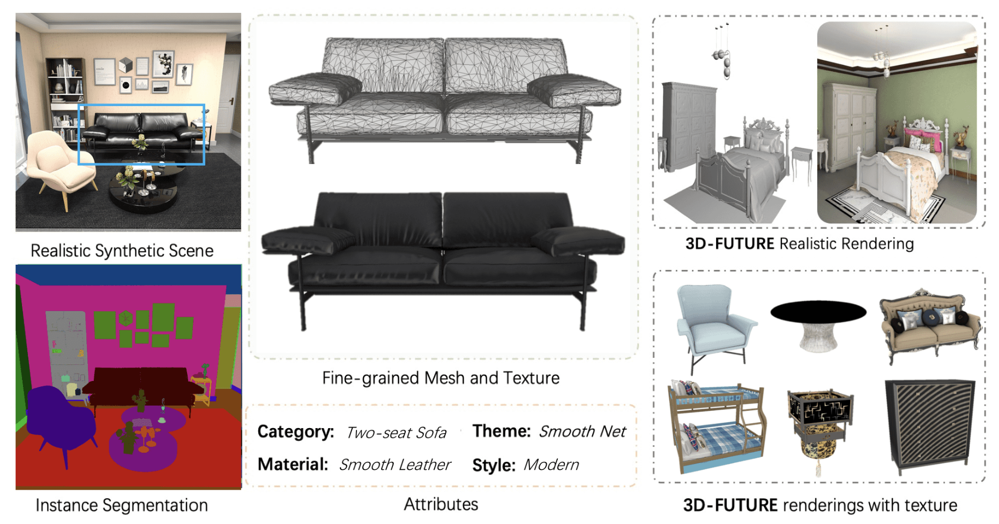

Before we can even start training any machine learning model, we need good training data. In this case, we need good labeled data for training the segmentation model (that will be explained in the next section). Labelling images for image segmentation requires to construct masks; color-coded pixel-by-pixel areas which distinguish one object from another. Creating such masks is a very time-intensive venture. So rather than constructing a database ourselves, we searched for an existing dataset.

We used the [3D-FUTURE: 3D FUrniture shape with TextURE dataset](https://tianchi.aliyun.com/specials/promotion/alibaba-3d-future) created by Fu et al., 2021, available upon request from Alibaba Cloud. This dataset contains 20 240 images of virtual indoor spaces, of which approximately 10 000 contain a sofa. That is why we decided to use the sofa as furniture to apply style transfer.


## 2.1 Which types of data do we have?

In the dataset that we downloaded, we can find several types of data:
- **train**: data that will be used to train the image segmentation model
- **test**: data that will be used to evaluate the performance of the trained image segmentation model
- **validation**: data that will be used to fine-tune the image segmentation model, i.e. find the best parameters to use in the model

We have created a folder for each of these data categories. It's important to mention that each folder contains itself 2 other folders, namely:
- **image**: original picture of a virtual indoor space
- **idmap**: color coded image that segment all furniture objects in the image

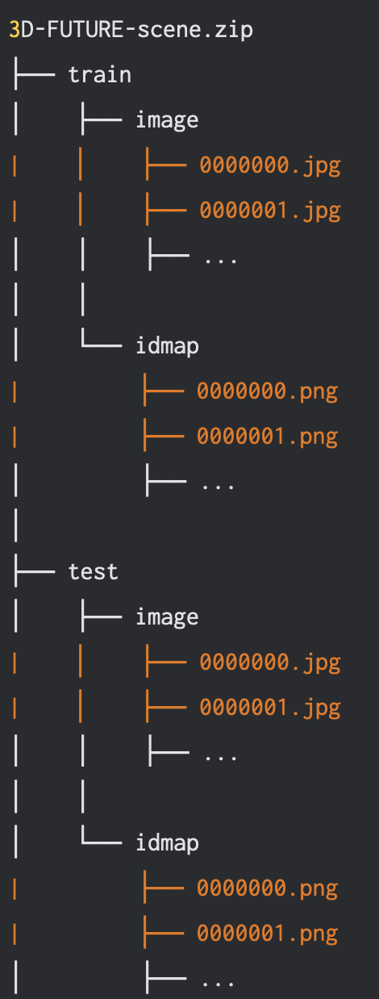

## 2.2 Connect to the GCP bucket


In [1]:
#@markdown ###Connecting to the cloud
#@markdown For ease of access, we have stored the data in the cloud (GCP).  
#@markdown Before being able to access data from a GCP bucket, you first need to login into GCP using the following command. Please follow the instructions!
#@markdown After connecting with your personnal account, you can access the bucket containing the data.

%%capture
from google.colab import auth
auth.authenticate_user()
!echo "deb http://packages.cloud.google.com/apt gcsfuse-bionic main" > /etc/apt/sources.list.d/gcsfuse.list
!curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | apt-key add -
!apt -qq update
!apt -qq install gcsfuse
!mkdir /content/data_bucket
!gcsfuse --implicit-dirs home_design_bucket /content/data_bucket

In [2]:
#@markdown ###Accessing the data
import os
DATA_DIR = '/content/data_bucket/raw_data'

# Create path to data
x_train_dir = os.path.join(DATA_DIR, 'train/image')
y_train_dir = os.path.join(DATA_DIR, 'train/mask')

x_valid_dir = os.path.join(DATA_DIR, 'validation/image')
y_valid_dir = os.path.join(DATA_DIR, 'validation/mask')

x_test_dir = os.path.join(DATA_DIR, 'test/image')
y_test_dir = os.path.join(DATA_DIR, 'test/mask')

width,length = 1184,1184

In [3]:
#@markdown ###Downloading the code
!git clone --quiet https://github.com/datarootsio/workshop-image-segmentation-style-transfer.git

## 2.3 Get some data from the cloud

Segmentation Models: using `keras` framework.


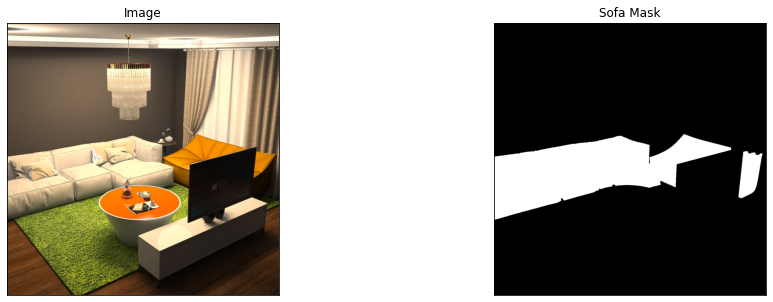

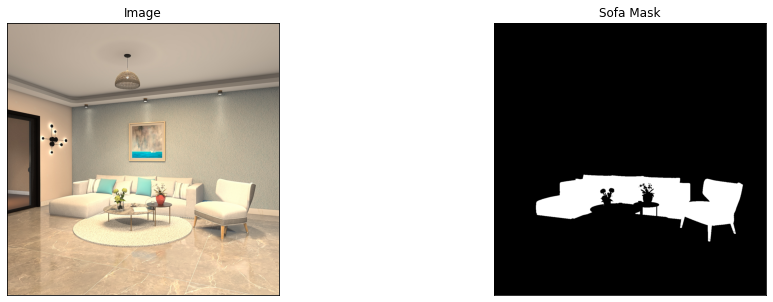

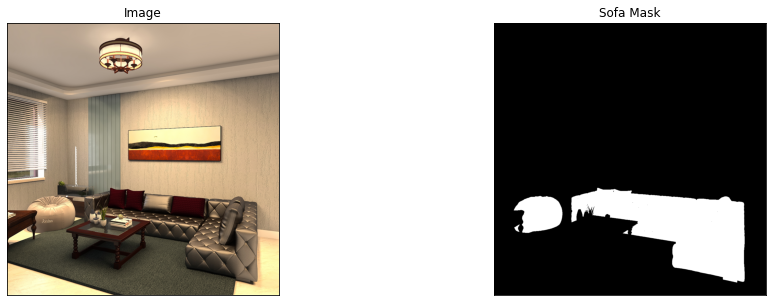

In [4]:
#@markdown For having a better idea of the images we are using, let's look at 3 examples. We observe that the mask correctly highlights the sofa on each picture.
#@markdown Sometimes the mask highlights a chair instead of a sofa. 
import matplotlib.pyplot as plt
import itertools
import os
import tensorflow as tf
import pandas as pd
import cv2
import keras
import numpy as np
import matplotlib.pyplot as plt

#import segmentation-models package and set framework to tf.keras
import segmentation_models as sm
sm.set_framework('tf.keras')
sm.framework()

def list_files(path_blob):
    images_dir = os.path.join(DATA_DIR, path_blob)
    list_elem = os.listdir(images_dir) 
    number_files = len(list_elem)
    print(f"Number of files in the {path_blob} folder: {number_files}")
    return list_elem, number_files

# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image, cmap='gray')
    plt.show()

from PIL import Image

list_images = os.listdir(y_train_dir)[:3]

for path in list_images:
  path_image = os.path.join(x_train_dir,  path.replace("png", "jpg"))
  path_mask = os.path.join(y_train_dir, path)
  image = Image.open(path_image)
  mask = Image.open(path_mask) 
  visualize(
      image=image, 
      sofa_mask=mask,
  )

# 3 Using image segmentation - Detect a sofa in your livingroom

Image segmentation is really helpful to detect objects on an image. In our case, we need to be able to detect a sofa in a livingroom's virtual picture. The final goal of this section is to create a model which is able to discover a sofa on unseen data, so that we could apply image segmentation to new pictures.

## 3.1 What is image segmentation

Image segmentation is the process of dividing an image into different regions
based on the characteristics of pixels to identify objects. In other words,
image segmentation is a computer vision algorithm that assigns label to each pixel of an image. All pixels belonging to the same label have a common category assign to them. 

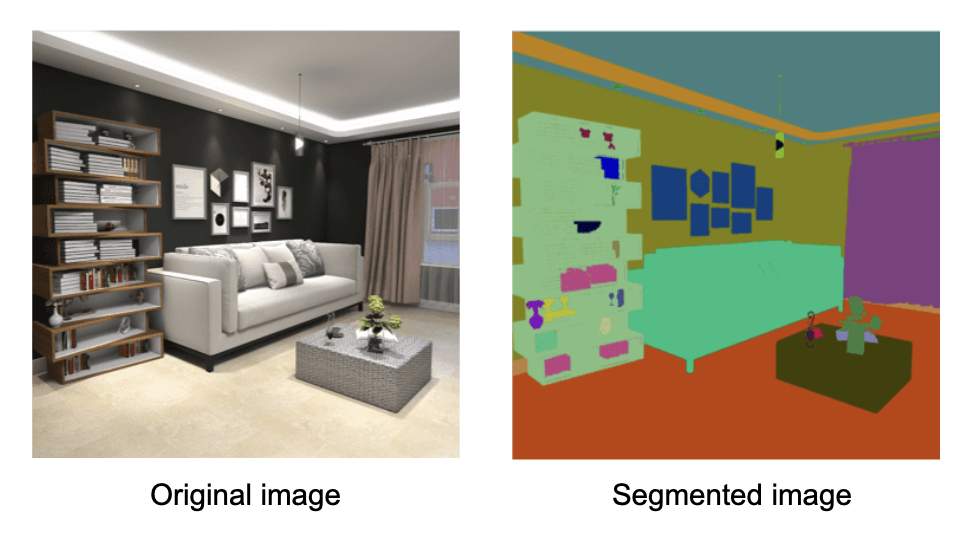

In our case, image segmentation is very useful because we want to transfer a new style to only one particular furniture, not to the entire picture. Therefore, that's important to be able to identify a furniture on a picture.

## 3.2 Create dataset to train the image segmentation model

In [5]:
#@markdown ### Create train and validation dataset for the image segmentation model
import tensorflow as tf

# Transform images and masks into dataframes
train_df = pd.DataFrame()
filenames = set([f.split(".")[0] for f in os.listdir(y_train_dir)]).intersection(
            set([f.split(".")[0] for f in os.listdir(x_train_dir)]))
train_df['mask']  = [os.path.join(y_train_dir, file+'.png') for file in filenames]
train_df['image'] = [os.path.join(x_train_dir, file+'.jpg') for file in filenames]


test_df = pd.DataFrame()
filenames = set([f.split(".")[0] for f in os.listdir(y_valid_dir)]).intersection(
            set([f.split(".")[0] for f in os.listdir(x_valid_dir)]))
test_df['mask']  = [os.path.join(y_valid_dir, file+'.png') for file in filenames]
test_df['image'] = [os.path.join(x_valid_dir, file+'.jpg') for file in filenames]

print(f"Number of training samples: {len(train_df)} \nNumber of testing samples: {len(test_df)}")

Number of training samples: 7321 
Number of testing samples: 2584


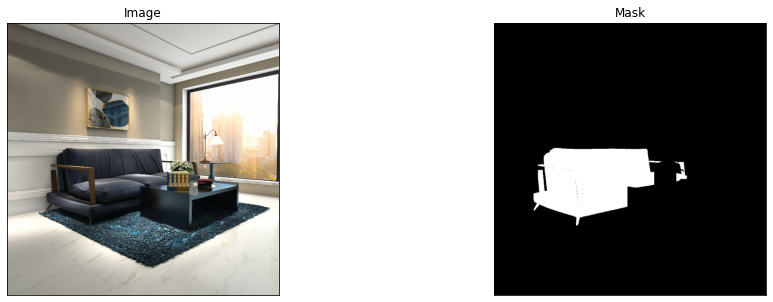

In [6]:
#@markdown ### Transform dataframes into datasets

IMG_SIZE = 640

def read_img(image, mask):
  '''Read, decode into array, resize and rescale images and masks'''

  im = tf.io.read_file(image)
  im = tf.io.decode_image(im, channels=3, dtype=tf.dtypes.float32, expand_animations=False)
  im = tf.image.resize(im, [IMG_SIZE,IMG_SIZE])
  im = tf.image.convert_image_dtype(im, tf.uint8)

  msk = tf.io.read_file(mask)
  msk = tf.image.decode_jpeg(msk, channels=3)
  msk = tf.image.resize(msk, [IMG_SIZE,IMG_SIZE])
  return im, msk

train_ds = tf.data.Dataset.from_tensor_slices((train_df['image'], train_df['mask']))
test_ds = tf.data.Dataset.from_tensor_slices((test_df['image'], test_df['mask']))

train_before = train_ds.map(read_img)
test_unbatch = test_ds.map(read_img)

eximage, exmask = list(train_before.shuffle(10).take(1).as_numpy_iterator())[0]
visualize(
    image = eximage,
    mask = exmask.squeeze()
)

## 3.3 Why do we need data augmentation?

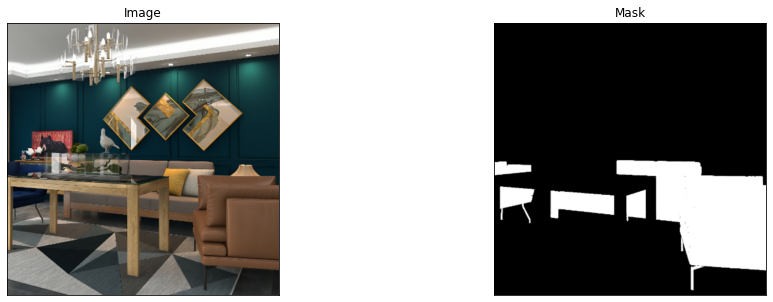

In [7]:
#@markdown Data augmentation is a powerful technique to increase the amount of your data and prevent model overfitting. Since our dataset is very small we will apply a large number of different data augmentation techniques:
#@markdown - horizontal flip
#@markdown - affine tranforms 
#@markdown - perspective transforms
#@markdown - brightness/contrast/colors manipulations
#@markdown - image bluring and sharpening
#@markdown - gaussian noise
#@markdown - random crops

#@markdown All these tranformations can be easily applied thanks to a fast augmentation library called [Albumentations](https://github.com/albu/albumentations/).
import tensorflow as tf

def augment_image(image, mask):
  seed_value = tf.random.uniform([2],maxval=100,dtype=np.int32)
  size = image.shape
  crop_ratio = .7
  im = tf.image.stateless_random_flip_left_right(image, seed=seed_value)
  msk = tf.image.stateless_random_flip_left_right(mask, seed=seed_value) 
  im = tf.image.stateless_random_crop(im, size = [round(size[0]*.7),round(size[1]*.7),3], seed=seed_value)
  msk = tf.image.stateless_random_crop(msk, size = [round(size[0]*.7),round(size[1]*.7),3], seed=seed_value)
  im = im/255
  im = tf.image.resize(im, size[:2])
  im = tf.image.convert_image_dtype(im, tf.uint8)
  msk = tf.image.resize(msk, size[:2])
  return im, msk

train = train_before.map(augment_image)
image, mask = list(train.take(10))[2]
visualize(image=image, mask=mask)

### 3.2.1 Effect of data augmentation methods

This data augmentation function may seem difficult to interpret at first. Let's take a look at the effect of some of the transformations that are performed in this function in order to understand it better.

Note: In the following cells, most of the transformations will have a probablility of 1 in order to be sure that the transformation can be observed. In the reallity, this is not the case, the probability of applying a transformation is between 0 and 1.

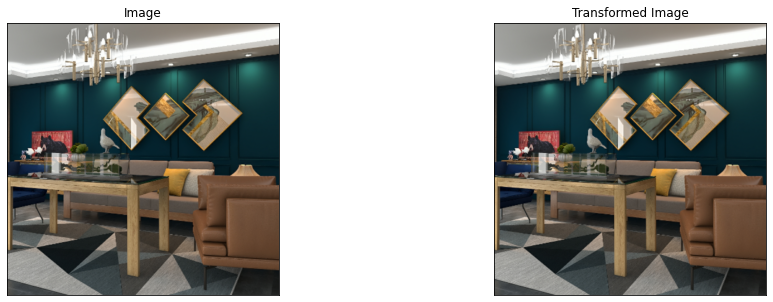

In [8]:
#@markdown **Horizontal flip of the image**

#@markdown In this example, the image is flipped horizontally. The input can be flipped either horizontally, vertically or both horizontally and vertically.

seed_value = tf.random.uniform([2],maxval=6,dtype=np.int32)
transformed_image = tf.image.stateless_random_flip_left_right(image, seed=seed_value)

visualize(
      image=image, 
      transformed_image=transformed_image,
  )

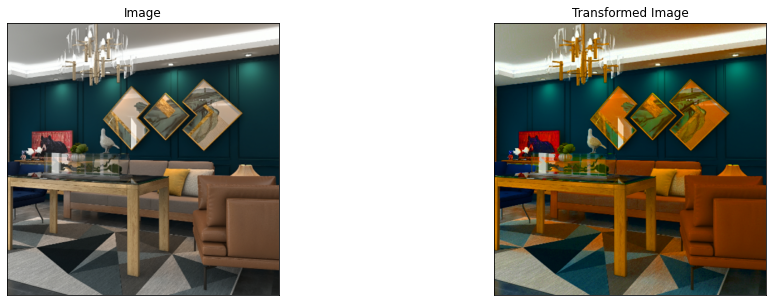

In [9]:
#@markdown **Brightness/contrast/colors manipulations**

#@markdown In the following example, the saturation of the input image is randomly changed.

transformed_image = tf.image.random_saturation(image, 5, 10)

visualize(
      image=image, 
      transformed_image=transformed_image,
  )

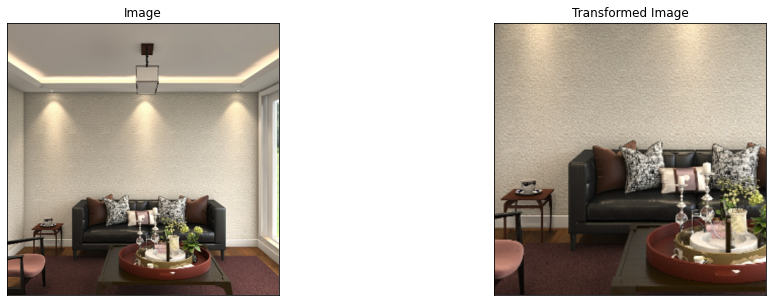

In [ ]:
#@markdown **Random crop**

#@markdown Crop the input image randomly.

size = image.shape
seed_value = tf.random.uniform([2],maxval=100,dtype=np.int32)
transformed_image = tf.image.stateless_random_crop(image, size = [round(size[0]*.6),round(size[1]*.6),3], seed=seed_value)

visualize(
      image=image, 
      transformed_image=transformed_image,
  )

Feel free to try other transformations if you want to see what impact they have on the input image. 

Note: Some transformations apply a change to the pixels of the image that is not visible to the naked eye

### 3.2.2 Look at some examples (images and masks)


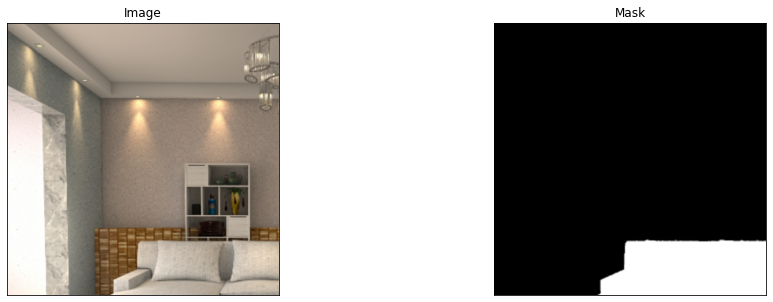

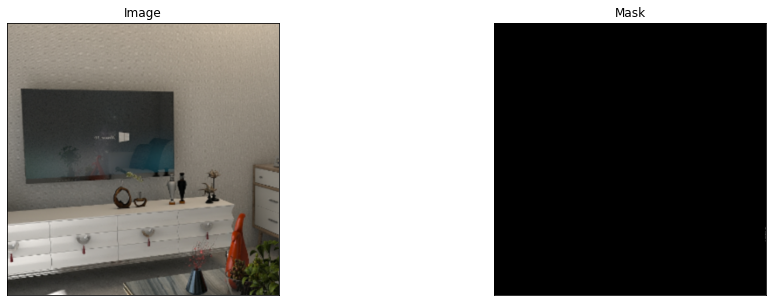

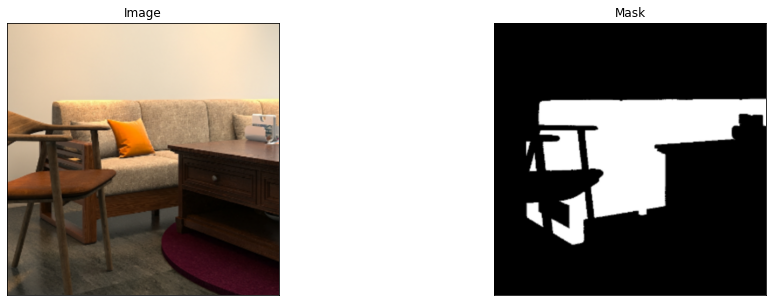

In [10]:
#@markdown Lets look at some augmented data we have created. You observe that augmented images are sub-parts of the original images. This is why you will regularly find augmented images containing a part of a sofa for example. 

foo = train.take(20).map(augment_image)
for i in range(3):
  eximage2, exmask2 = list(foo.shuffle(5).take(3).as_numpy_iterator())[i] 
  visualize(image=eximage2, mask = exmask2)

## 3.4 How to train an image segmentation model?

Now that we have enough data, it's time to build an image segmentation model in order to be able to predict the mask on a new picture. 

<span style="color:red">Warning: Training a model from scratch requires a lot of time and computing resources </span>

Fortunately, we already trained a model for you so that you don't need to train a model from scratch again. If you plan to use the trained model, you can directly go to the next section.

In [11]:
#@markdown The pre-trained image segmentation model that is used here is called Unet. It is one of the most popular approaches used in any segmentation task today. It is a fully convolutional neural network that is designed to learn from fewer training samples. If you want to know more about the architecture of this encoder-decoder model, let's look at [this link](https://medium.com/analytics-vidhya/what-is-unet-157314c87634).

#@markdown Before building the model in the following code, let's define some important terms:
#@markdown - **Backbone**: is the architectural element which defines how the layers should be arranged in the encoder network and how the decoder network should be built.
BACKBONE = 'resnet50' #@param ['resnet50','efficientnetb0','vgg16','mobilenet']{type:"string"}
#@markdown - **Batch size**: defines the number of samples that will be propagated through the network. For example, if you have 100 training samples and a batch size of 20, you will first consider the 20 first samples (from 1st to 20th) and train the model with this batch. Then, you will consider the next 20 samples (from 21th to 40th) and train the model again. We can keep doing this procedure until we have propagated all samples through of the network.
BATCH_SIZE = 2 #@param {type:"integer"}
#@markdown - **Epoch**: One epoch consists of one forward pass and one backward pass of all the training examples
EPOCHS = 10 #@param {type:"integer"}
#@markdown - **LR**: (Learning Rate) is a tuning parameter in an optimization algorithm that determines the step size at each iteration while moving toward a minimum of a loss function
LR = 0.0001 #@param {type:"number"}

#import packages
import os
import tensorflow as tf
import pandas as pd
import cv2
import numpy as np
import matplotlib.pyplot as plt

#import segmentation-models package and set framework to tf.keras
import segmentation_models as sm
sm.set_framework('tf.keras')
sm.framework()

# Set parameters
CLASSES = ['sofa']
n_classes = len(CLASSES) + (len(CLASSES)>1)
IMG_SIZE = 320

activation = 'sigmoid' if n_classes == 1 else 'softmax'

preprocess_input = sm.get_preprocessing(BACKBONE)

train = train.batch(BATCH_SIZE)
test = test_unbatch.batch(BATCH_SIZE)

#create image segmentation model
device_name = tf.test.gpu_device_name()
with tf.device(device_name):
  model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)

94601216/94592056 [==============================] - 1s 0us/step


In [12]:
#@markdown Now that we have created the image segmentation model, we need to define the optimizer, loss and metrics that will be computed by this model: 

#@markdown - **Optimizer**: We chose the Adam optimizer from Keras. Adam is a replacement optimization algorithm for stochastic gradient descent for training deep learning models.
#@markdown - **Dice loss**: This loss is obtained by calculating smooth dice coefficient function. This loss is the most commonly used loss is segmentation problems.
#@markdown - **Focal loss**: This loss is an improvement to the standard cross-entropy criterion. This is done by changing its shape such that the loss assigned to well-classified examples is down-weighted. Ultimately, this ensures that there is no class imbalance. 
#@markdown - **IoU score**: The Intersection over Union (IoU) metric is essentially a method to quantify the percent overlap between the target mask and our prediction output.
#@markdown - **F-score**: The F-score can be interpreted as a weighted average of the precision and recall

with tf.device(device_name):
  # define optomizer
  optim = tf.keras.optimizers.Adam(LR)

  # Segmentation models losses can be combined together by '+' and scaled by integer or float factor
  dice_loss = sm.losses.DiceLoss()
  focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
  total_loss = dice_loss + (1 * focal_loss)

  metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

  # define callbacks for learning rate scheduling and best checkpoints saving
  callbacks = [
      keras.callbacks.ModelCheckpoint('./checkpoint.h5', save_weights_only=True, save_best_only=True, mode='min'),
      keras.callbacks.ReduceLROnPlateau(),
  ]

  # compile keras model with defined optimozer, loss and metrics
  model.compile(optim, total_loss, metrics)

In [ ]:
#@markdown The following code starts the training of the model. This is probably the longest part of the tutorial, if you don't want to wait for 3 hours before getting results, you can directly go to the next section.
# train model
history = model.fit(
    train, 
    validation_data=test,
    epochs=EPOCHS, 
    callbacks=callbacks
)

history.history

In [ ]:
#@markdown Let's look at the evolution of each metric over the epochs
import matplotlib.pyplot as plt

# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

## 3.5 Performance of segmentation model on unseen data (test dataset)

In [ ]:
#@markdown This section helps you determining the performance of the image segmentation model that you just created. To do that, we evaluate the model on unseen data, i.e. the test set. 
# Evaluate model performance on "test" set

!wget -O model_final.h5 'https://storage.googleapis.com/home_design_bucket/models/model_final.h5'
path_load_model = './model_final.h5'
model.load_weights(path_load_model)

scores = model.evaluate(test)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))


## 3.6 Results

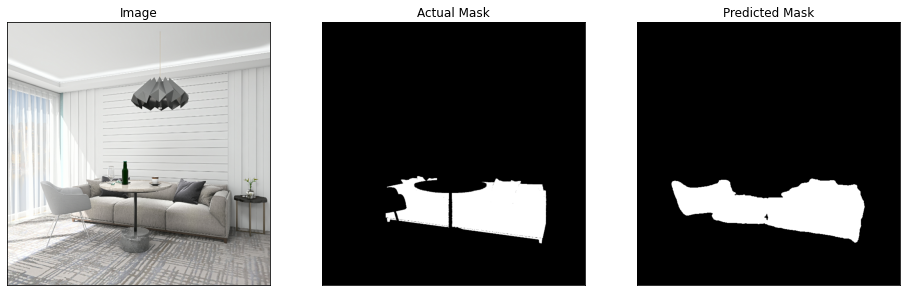

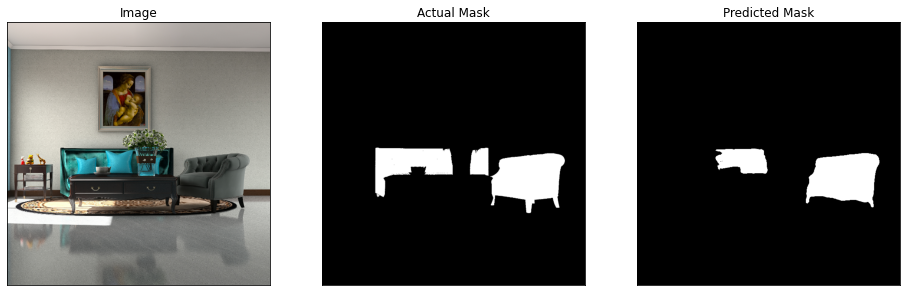

In [14]:
#@markdown Now that we evaluated the performance of our model, we can visualize the predicted mask of the model on unseen data. Let's look at 2 examples
from PIL import Image 

BACKBONE = "resnet50"
preprocess_input = sm.get_preprocessing(BACKBONE)
model = keras.models.load_model("./model_final.h5", compile=False)

for i in range(2):
  eximage, exmask = list(test.unbatch().shuffle(20).take(3).as_numpy_iterator())[i]
  image = eximage
  actual_mask = exmask
  prediction = model.predict(np.expand_dims(image, axis=0)).round()
  mask = Image.fromarray(prediction[..., 0].squeeze() * 255).convert("L")

  visualize(
      image = image.squeeze(),
      actual_mask=actual_mask.squeeze(),
      predicted_mask=mask
  )

# 4 Using style transfer - Customize your sofa

In this section, we will discover how to apply a style on top of a picture. If you remember, our ultimate goal is to apply a new style to a sofa on a virtual indoor space picture.

References: Y. Deng et al. "StyTr^2: Image Style Transfer with Transformers", IEEE Conference on Computer Vision and Pattern Recognition (CVPR), (2022). Github repository at https://github.com/diyiiyiii/StyTR-2

## 4.1 What is style transfer?

Style transfer is a computer vision technique that takes two images:
- a content image: the image with the content
- a style image: the image with the style/pattern to apply

The method then consists of blending these two images together so that the resulting output image retains the core elements of the content image, but appears to be "painted" in the style of the style image.

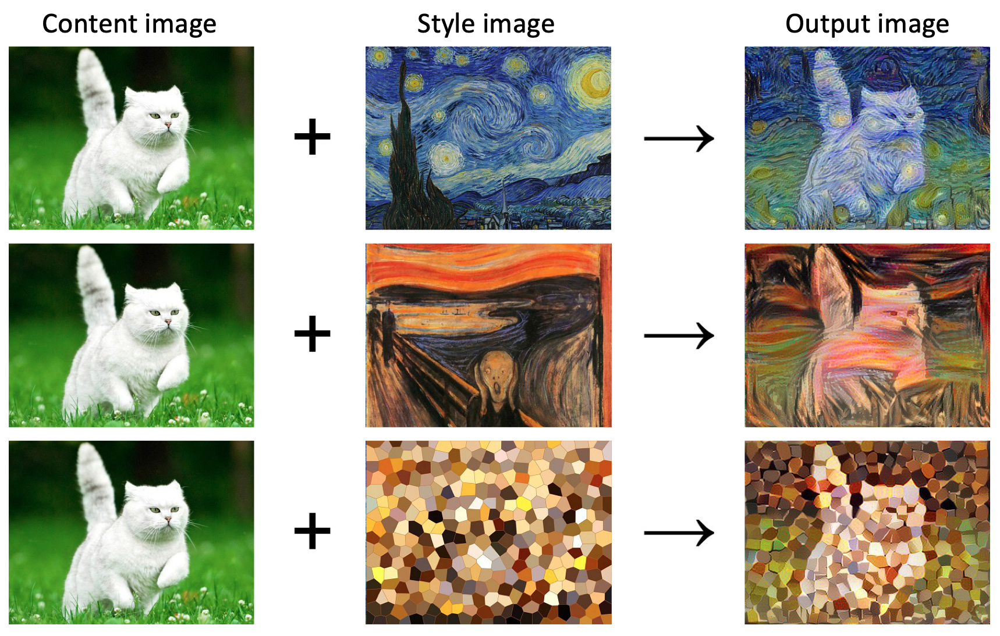

## 4.2 Choose the style to apply to our sofa

You can choose between 4 patterns that can be applied to the sofa, let's choose the one that you prefer!

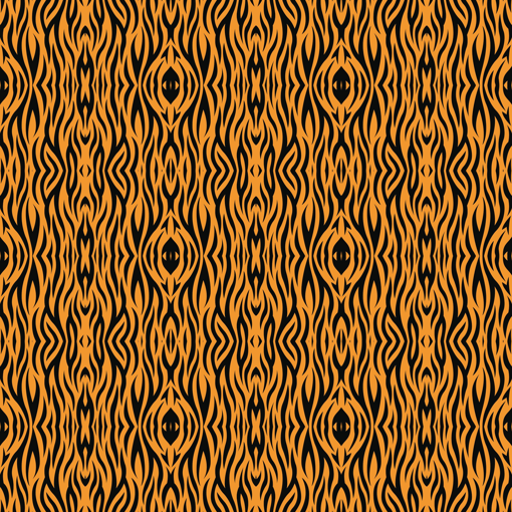

In [15]:
#@markdown It's now time to choose the pattern that you want to apply to the frame. You can either load a pattern that is already stored in Azure (5 possibilites) or you can upload your own pattern locally.

# Get style example from Azure or upload your own
import os
from PIL import Image
from IPython.display import display
import numpy as np

DATA_DIR_STYLING ="/content/data_bucket"
styles = {
    "multi-color": "styles/multicolor_pattern.jpeg",
    "tiger": "styles/tiger_pattern.jpeg",
    "water": "styles/water_pattern.jpeg",
    "zebra": "styles/zebra_pattern.jpeg",
    "zebra-color": "styles/zebra_color_pattern.jpeg"
}

pattern = "tiger" #@param {type:str} ["multi-color","tiger","water","zebra","zebra-color","custom","stable-diffusion"]
if pattern in styles.keys():
  style_path = os.path.join(DATA_DIR_STYLING, styles[pattern])
elif pattern == "custom": 
  style_path = upload_files()[0]
else:
  style_path = "/content/stable_diffusion_image.png"
  assert os.path.exists(style_path), "No stable diffusion image is detectec"
img = Image.open(style_path)
img.save(f"{pattern}.jpg")


# Resize the pattern to the approriate heigth and width
width, height = img.size
idx = np.argmin([width,height])

if idx==0:
  top= (height-width)//2
  bottom= height-(height-width)//2
  left = 0
  right= width
else:
  left = (width-height)//2
  right = width - (width-height)//2
  top = 0
  bottom = height

newsize = (512, 512)
im1 = img.crop((left, top, right, bottom))
im1 = im1.resize(newsize)

# Customize the pattern 
#@markdown We will copy it multiple times to create a pattern.
copies = 6 #@param {type:"slider", min:0, max:20, step:2}
if copies > 0:
  resize = (newsize[0]//copies,newsize[1]//copies)
  dst = Image.new('RGB', (resize[0]*copies,resize[1]*copies))
  im2 = im1.resize((resize))
  for row in range(copies):
    im2 = im2.transpose(Image.FLIP_LEFT_RIGHT)
    for column in range(copies):
      im2 = im2.transpose(Image.FLIP_TOP_BOTTOM)
      dst.paste(im2, (resize[0]*row, resize[1]*column))
  dst = dst.resize((newsize))
  dst.save('./style_customized.jpg')
  display(dst)
else: 
  display(im1)

## 4.3 Choose images on which to apply style transfer

Now that we chose the style to apply, we need to determine on which picture to apply this style. Let's choose the image on which we want to apply the new style and resize it

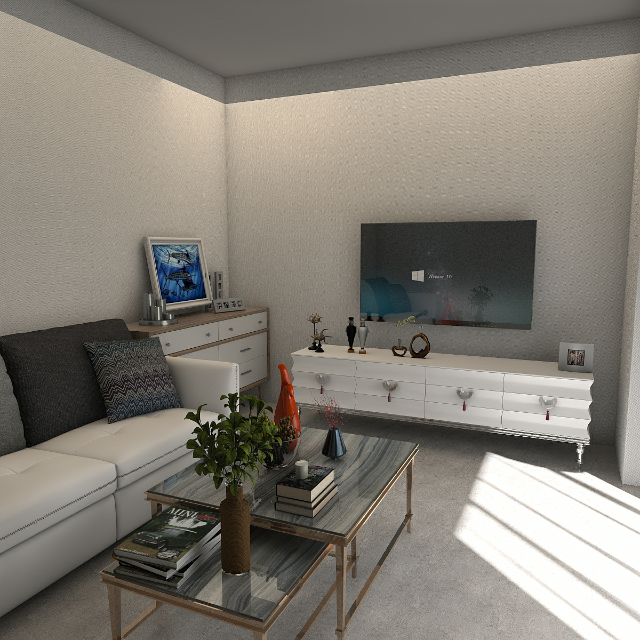

In [16]:
#@markdown The image to be customized shows a meeting room at the dataroots office. This image was stored in GCP so that you can access it easily. 

#@markdown If you don't like it you can upload your own image (with a frame) by selecting "custom".

#@markdown **This option does not work in Safari, please switch to chrome if you want to use a custom image.**

from PIL import Image
import os
import numpy as np
from IPython.display import display
from google.colab import files

def upload_files():
  uploaded = files.upload()
  for k, v in uploaded.items():
    open(k, 'wb').write(v)
  return list(uploaded.keys())

image = "default" #@param {type: str} ["default","custom"]
if image == "default":
  image_to_custom,_ = list(train_before.take(5).as_numpy_iterator())[1]
  new_img = Image.fromarray(image_to_custom)
else: 
  image_to_custom = upload_files()[0]
  img = Image.open(image_to_custom)
  width, height = img.size
  idx = np.argmin([width,height])

  if idx==0:
    top= (height-width)//2
    bottom= height-(height-width)//2
    left = 0
    right= width
  else:
    left = (width-height)//2
    right = width - (width-height)//2
    top = 0
    bottom = height

  new_img = img.crop((left, top, right, bottom))

width, height = new_img.size
new_img.save(f"image_to_custom.jpg")
display(new_img)

## 4.4 Apply the new style to our virtual indoor space image

In [17]:
#@markdown Let's first clone a GitHub repository containing the code that we will use to apply the style transfer. This style transfer technique is based on transformers. This means that we will run very complex model that are already pre-trained and that are very accurate.
%cd /content/
!git clone --quiet https://github.com/diyiiyiii/StyTR-2.git > /dev/null
# fix an error in one of the files of the github repo
!mv workshop-image-segmentation-style-transfer/scripts/apply_pattern.py StyTR-2/ > /dev/null 
!wget -O model_final.h5 'https://storage.googleapis.com/home_design_bucket/models/model_final.h5'

/content
--2023-03-24 15:43:29--  https://storage.googleapis.com/home_design_bucket/models/model_final.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.152.128, 142.250.128.128, 142.251.6.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.152.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 130858696 (125M) [application/octet-stream]
Saving to: ‘model_final.h5’

model_final.h5      100%[===================>] 124.80M  30.6MB/s    in 4.7s    

2023-03-24 15:43:34 (26.5 MB/s) - ‘model_final.h5’ saved [130858696/130858696]



image_to_custom.jpg
<class 'int'>
/content/styletransformer/lib/python3.9/site-packages/torch/nn/functional.py:3060: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


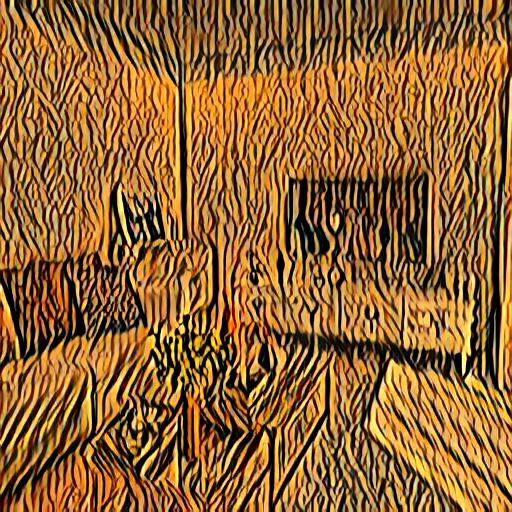

In [18]:
#@markdown The goal of this section is to apply the pattern to the entire picture.
#@markdown Let's give the image and the pattern to the style transformer and see what it comes up with.

#@markdown **This may take a minute...**

# Get pre-trained model from the cloud
import os 
vgg_path = os.path.join(DATA_DIR_STYLING, "models/vgg_normalised.pth")
decoder_path = os.path.join(DATA_DIR_STYLING, "models/decoder_iter_160000.pth")
transformer_path = os.path.join(DATA_DIR_STYLING, "models/transformer_iter_160000.pth")
embedding_path = os.path.join(DATA_DIR_STYLING, "models/embedding_iter_160000.pth")
uploaded_image = "image_to_custom.jpg"

# style the image
!source /content/styletransformer/bin/activate; python StyTR-2/apply_pattern.py  --content $uploaded_image \
                  --style style_customized.jpg  \
                  --output  .\
                  --vgg $vgg_path \
                  --decoder_path $decoder_path \
                  --Trans_path $transformer_path \
                  --embedding_path $embedding_path

# Let's look at the styled image
from IPython.display import Image, display
path_styled_image = uploaded_image.split(".")[0] + "_stylized_style_customized.jpg"
display(Image(filename=path_styled_image))

from PIL import Image as Img
Img.open(path_styled_image).resize((width, height)).save(path_styled_image)

# 5 Let's put everything together

On one hand, we have an image segmentation model that allows us to detect a sofa on a picture and that creates a mask of this sofa. On the other hand, we created a style transfer model that allows us to apply a style to an entire picture. The goal now is to put everything together to apply the style on the sofa only and not on the entire picture.

Get actual mask from the cloud


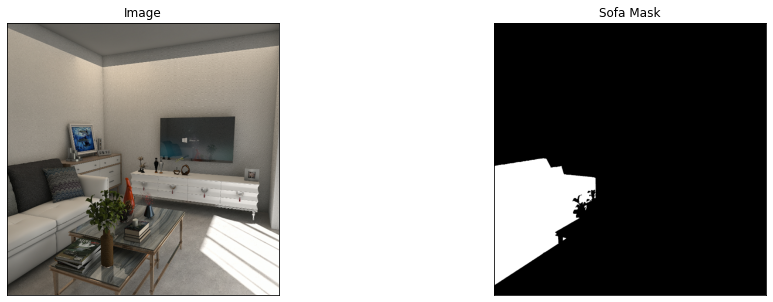

In [19]:
#@markdown ### Predict the mask or get it from GCP 
#@markdown In the previous chapter, you could train an image segmentation model. 
#@markdown We disabled that part of the code to avoid having to wait too long for the model to train.
#@markdown But don't worry! You can load a previously rendered mask of the default frame from GCP. 

import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import imageio

import tensorflow as tf
device_name = tf.test.gpu_device_name()

with tf.device(device_name):
  model = sm.Unet('resnet50', classes=1, activation='sigmoid')
  optim = tf.keras.optimizers.Adam(0.0001)
  dice_loss = sm.losses.DiceLoss()
  focal_loss = sm.losses.BinaryFocalLoss()
  total_loss = dice_loss + (1 * focal_loss)
  metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]
  model.compile(optim, total_loss, metrics)

# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image,cmap='gray')
    plt.show()

if image != "default":
  print("Predicting mask")
  IMG_SIZE = 640
  im = tf.io.read_file("image_to_custom.jpg")
  im = tf.io.decode_image(im, channels=3, dtype=tf.dtypes.float32, expand_animations=False)
  im = tf.image.resize(im, [IMG_SIZE,IMG_SIZE])
  im = tf.image.convert_image_dtype(im, tf.uint8)
  im = np.expand_dims(im, axis=0)

  model.load_weights("model_final.h5")
  pred_mask = model.predict(im).round()
  mask = Image.fromarray(pred_mask[..., 0].squeeze() * 255).convert("L")
  pred_mask_to_save = mask.resize((width, height))

  visualize(
      original_image = img,
      predicted_mask=pred_mask.squeeze()
  )
  
  pred_mask_to_save.save('mask.jpg')

else:
  print("Get actual mask from the cloud")
  img, mask = list(train_before.take(5).as_numpy_iterator())[1]

  visualize(
      image=img, 
      sofa_mask=mask[..., 0].squeeze(),
  )

  imageio.imwrite('mask.jpg', mask[..., 0].squeeze())

<ipython-input-20-ed4b782c27cc>:47: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  generated_image = imageio.imread(generated_image, pilmode="RGB")
<ipython-input-20-ed4b782c27cc>:50: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  content_image = imageio.imread(content_image, pilmode='RGB')
<ipython-input-20-ed4b782c27cc>:17: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  mask = imagei

Image saved at path : image_to_custom_stylized_style_customized_masked.png


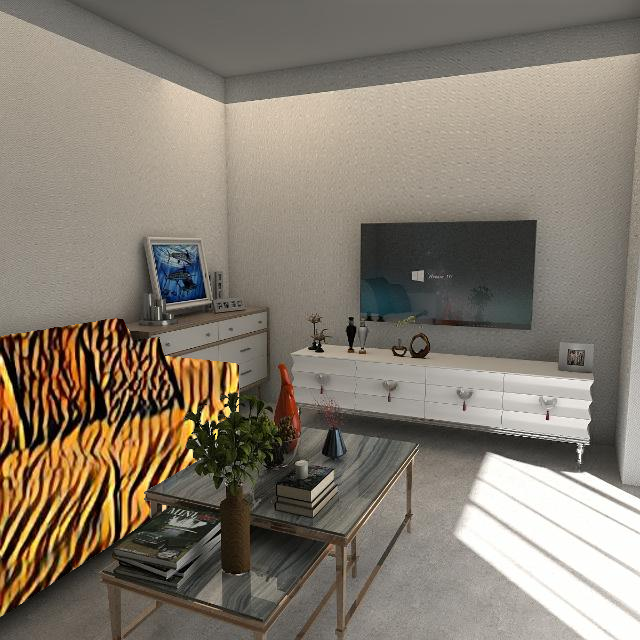

In [20]:
#@markdown ### Apply style only on the chosen object
#@markdown The last step of this tutorial session is to apply the new style only on the sofa and not on the entire picture using the mask determined in the previous section.

#@markdown **Acknoledgement**: The following code was inspired by this repo: https://github.com/titu1994/Neural-Style-Transfer.git
content_image = "image_to_custom.jpg"
generated_image = "image_to_custom_stylized_style_customized.jpg"
content_mask = "mask.jpg"

import os
import numpy as np
import imageio
from PIL import Image as Img
from PIL import ImageTk

# util function to load masks
def load_mask(mask_path, shape):
    mask = imageio.imread(mask_path, pilmode="L") # Grayscale mask load
    width, height, _ = shape
    mask = np.array(Img.fromarray(mask).resize((width, height))).astype('float32')

    # Perform binarization of mask
    mask[mask <= 127] = 0
    mask[mask > 128] = 255

    max = np.amax(mask)
    mask /= max

    return mask


# util function to apply mask to generated image
def mask_content(content, generated, mask):
    width, height, channels = generated.shape

    for i in range(width):
        for j in range(height):
            if mask[i, j] == 0.:
                generated[i, j, :] = content[i, j, :]

    return generated

  
# util function to generate the final masked image
def save_final_masked(content_image, generated_image, content_mask):
  image_path = os.path.splitext(generated_image)[0] + "_masked.png"

  generated_image = imageio.imread(generated_image, pilmode="RGB")
  img_width, img_height, channels = generated_image.shape

  content_image = imageio.imread(content_image, pilmode='RGB')
  content_image = np.array(Img.fromarray(content_image).resize((img_width, img_height)))

  mask = load_mask(content_mask, generated_image.shape)

  img = mask_content(content_image, generated_image, mask)
  imageio.imwrite(image_path, img)

  return image_path

save_image_path = save_final_masked(content_image, generated_image, content_mask)
print("Image saved at path : %s" % save_image_path)
# Let's look at the final styled image
from IPython.display import Image, display
display(Image(filename="image_to_custom_stylized_style_customized_masked.png"))

# 6 Next steps: What could be improved?

In the previous sections, we discovered how to apply a style transfer to a particular object in an image. However, there are still some areas that can be improved.

## 6.1 In the image segmentation model

When evaluating the image segmentation model, we observed that the model struggled to differentiate between sofas and chairs. In some of the images, even a human would have difficulty identifying whether the object belongs to the sofa or chair category. This observation highlights the fact that a model is often biased by the data on which it is trained. It is therefore important to be aware of this bias and to try to minimise it. In our case, confusing a sofa with a chair is not dramatic. However, if this kind of bias appears in models representing the population, it can have serious consequences. Imagine a facial recognition model that is able to recognise men but not women, or people of European origin but not Asian. 

To solve this problem, we could train the model on more data and train it longer. However, this solution is very expensive in terms of resources and time. 

## 6.2 In the style transfer model

For the moment, the new style is applied to the whole image and it is the style transfer model that determines which objects in the image are most important, i.e. that will receive the most customization. This means that if we are working with an image in which the sofa is in the background, the model will only apply a small amount of styling to that object, as it is not highlighted. Ideally, we would like the style to always be applied to the sofa, no matter where it is positioned in the image. 

<ipython-input-20-ed4b782c27cc>:47: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  generated_image = imageio.imread(generated_image, pilmode="RGB")
<ipython-input-20-ed4b782c27cc>:50: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  content_image = imageio.imread(content_image, pilmode='RGB')
<ipython-input-20-ed4b782c27cc>:17: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  mask = imagei

Image saved at path : image_to_custom_masked.png
image_to_custom_masked.png
<class 'int'>
/content/styletransformer/lib/python3.9/site-packages/torch/nn/functional.py:3060: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


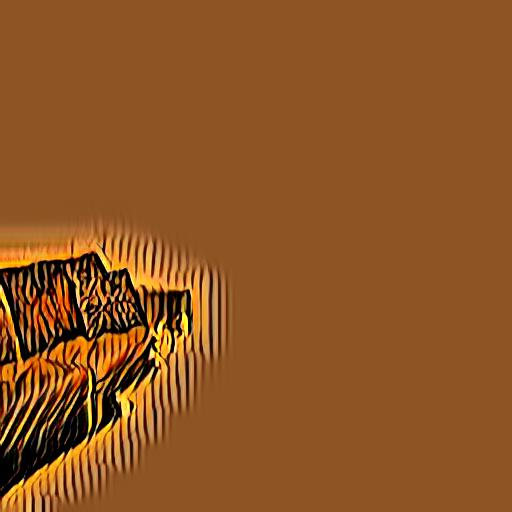

Image saved at path : image_to_custom_masked_stylized_style_customized_masked.png


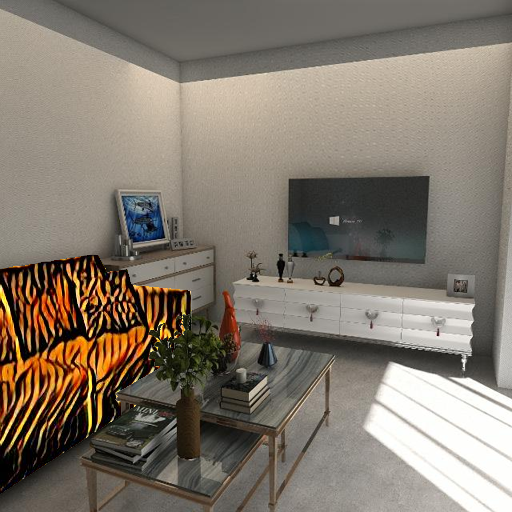

In [21]:
#@markdown To solve this problem, we could apply the mask to the original image first to keep only the important object. This means that the style transfer model would only be able to highlight the really important object since there would only be that object in the picture. Then the stylized object would be copied and pasted onto the original image ignoring the rest of the image. 

# Create transparent picture
from PIL import Image as Img
from IPython.display import Image, display
image = Img.new('RGBA', (512, 512), (255,255,255,0))
image.save("transparent.png")

content_image = "transparent.png"
generated_image = "image_to_custom.jpg"
content_mask = "mask.jpg"

save_image_path = save_final_masked(content_image, generated_image, content_mask)
print("Image saved at path : %s" % save_image_path)

# style the image
!source /content/styletransformer/bin/activate; python StyTR-2/apply_pattern.py  --content $save_image_path \
                  --style style_customized.jpg  \
                  --output  .\
                  --vgg $vgg_path \
                  --decoder_path $decoder_path \
                  --Trans_path $transformer_path \
                  --embedding_path $embedding_path

# Let's look at the styled masked image
display(Image(filename="image_to_custom_masked_stylized_style_customized.jpg"))

content_image = "image_to_custom.jpg"
generated_image = "image_to_custom_masked_stylized_style_customized.jpg"

save_image_path = save_final_masked(content_image, generated_image, content_mask)
print("Image saved at path : %s" % save_image_path)

# Let's look at the masked original image
display(Image(filename="image_to_custom_masked_stylized_style_customized_masked.png"))

## 6.3 Using stable diffusion to generate patterns
Stable Diffusion is a deep learning, text-to-image model released in 2022. It is primarily used to generate detailed images conditioned on text descriptions, though it can also be applied to other tasks such as inpainting, outpainting, and generating image-to-image translations guided by a text prompt.

In short, you could see stable diffusion as a model that is extremely well trained in denoising images. By iteratively putting more noise on images and asking stable diffusion to reconstruct the image, researchers eventually developed a model that could create images from just noise!

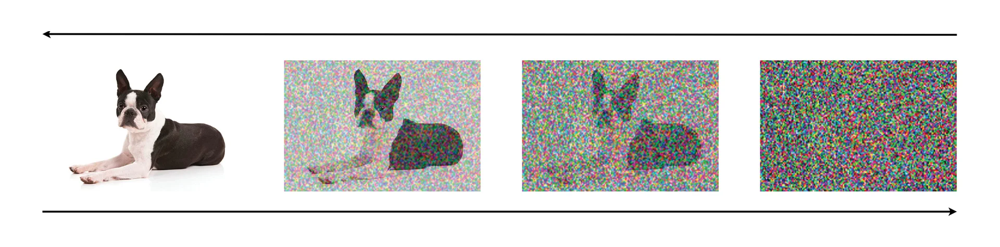


Its code and model weights have been released publicly, which allows us to generate new patterns to put on our sofa!

In [22]:
#@markdown Choose the stable diffusion model you want to work with
import torch
from diffusers import StableDiffusionPipeline
sd_model = "runwayml/stable-diffusion-v1-5" #@param {type : "string"} ["CompVis/stable-diffusion-v1-4","runwayml/stable-diffusion-v1-5","stabilityai/stable-diffusion-2-1-base","stabilityai/stable-diffusion-2-1"]
def setup_sd():
  pipe = StableDiffusionPipeline.from_pretrained(sd_model, torch_dtype=torch.float16)  
  pipe = pipe.to("cuda")
  return pipe
  
pipe = setup_sd()



Fetching 20 files:   0%|          | 0/20 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
The config attributes {'scaling_factor': 0.18215} were passed to AutoencoderKL, but are not expected and will be ignored. Please verify your config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

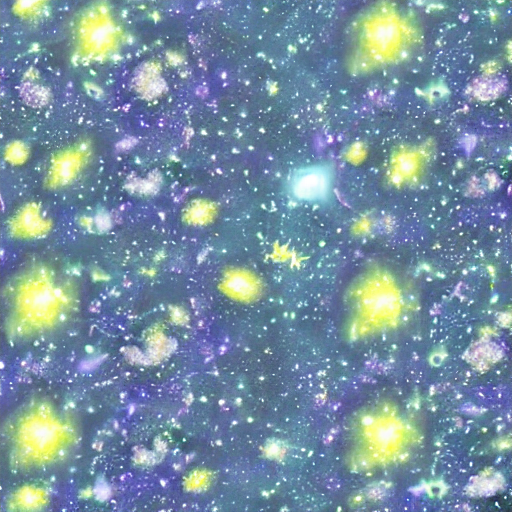

In [25]:
#@markdown Now you can generate your own cool pattern with stable diffusion. Just type in some text and see what comes out!
prompt = "a galaxy pattern" #@param {type : "string"}
image = pipe(prompt).images[0]  # image here is in [PIL format](https://pillow.readthedocs.io/en/stable/)

# Now to display an image you can either save it such as:
image.save(f"stable_diffusion_image.png")

# or if you're in a google colab you can directly display it with 
image

Now go back to the previous section to use this new cool pattern in the style transformer.